In [1]:
import os, json,cortex
import numpy as np
from config.dir import DATA_DIR,REPO_DIR
from sklearn.preprocessing import StandardScaler
from voxelwise_tutorials.delayer import Delayer
from himalaya.kernel_ridge import KernelRidgeCV
from himalaya.backend import set_backend
from sklearn.pipeline import make_pipeline
from voxelwise_tutorials.utils import generate_leave_one_run_out
from sklearn.model_selection import check_cv
import matplotlib.pyplot as plt
from utils.npp import zscore

# Using a single subject 3 for training & testing

In [2]:
subject = "sub-UTS03"
dir ='results/eng1000'
with open(os.path.join(REPO_DIR, dir,subject,'features_train.json'), "r") as f:
	X_train = json.load(f)
with open(os.path.join(REPO_DIR, dir,subject,'features_test.json'), "r") as f:
	X_test = json.load(f)
X_train = np.array(X_train, dtype=float)
X_test = np.array(X_test, dtype=float)
print("(n_samples_train, n_features) =", X_train.shape)
print("(n_samples_test, n_features) =", X_test.shape)

(n_samples_train, n_features) = (11414, 985)
(n_samples_test, n_features) = (291, 985)


In [3]:
print("Mean of features(train):",np.mean(X_train))
print("Standard deviation of features(train): ",np.std(X_train))
print("Mean of features(test) :",np.mean(X_test))
print("Standard deviation of features(test): ",np.std(X_test))

Mean of features(train): -7.513199163833951e-18
Standard deviation of features(train):  1.0
Mean of features(test) : -2.4590799932807207e-17
Standard deviation of features(test):  1.0


In [4]:
with open(os.path.join(REPO_DIR, dir,subject,'fmri_train.json'), "r") as f:
	Y_train = json.load(f)
with open(os.path.join(REPO_DIR, dir,subject,'fmri_test.json'), "r") as f:
	Y_test = json.load(f)
Y_train = np.array(Y_train, dtype=float)
Y_test = np.array(Y_test, dtype=float)
Y_test=zscore(Y_test)
print("(n_samples_train, n_voxels) =", Y_train.shape)
print("( n_samples_test, n_voxels) =", Y_test.shape)

(n_samples_train, n_voxels) = (11414, 95556)
( n_samples_test, n_voxels) = (291, 95556)


In [5]:
print("Mean of fmri(train):",np.mean(Y_train))
print("Standard deviation of fmri(train):",np.std(Y_train))
print("Mean of fmri(test):",np.mean(Y_test))
print("Standard deviation of fmri(test):",np.std(Y_test))

Mean of fmri(train): -6.404209986505114e-19
Standard deviation of fmri(train): 1.0
Mean of fmri(test): -2.09328902594414e-18
Standard deviation of fmri(test): 1.0


# Get run onsets for cross-validation

In [6]:
with open(os.path.join(REPO_DIR, dir,subject,'run_on.json'), "r") as f:
	run_onsets = json.load(f)
len(run_onsets)

32

In [7]:
n_samples_train = X_train.shape[0]
cv = generate_leave_one_run_out(n_samples_train, run_onsets)
cv = check_cv(cv)  # copy the cross-validation splitter into a reusable list

In [8]:
X_train_= X_train.astype("float32")
alphas = np.logspace(0, 25, 20)

In [9]:
backend = set_backend("torch_cuda", on_error="warn")
print(backend)

<module 'himalaya.backend.torch_cuda' from '/home/ckj24/miniforge-pypy3/envs/fmri-algo/lib/python3.13/site-packages/himalaya/backend/torch_cuda.py'>


# Create training model pipline 

In [10]:
pipeline = make_pipeline(
    StandardScaler(with_mean=True, with_std=False),
    Delayer(delays=[1, 2, 3, 4]),
    KernelRidgeCV(
        alphas=alphas, cv=cv,
        solver_params=dict(n_targets_batch=500, n_alphas_batch=5,
                           n_targets_batch_refit=100)),
)

In [11]:
_ = pipeline.fit(X_train, Y_train)

/home/ckj24/miniforge-pypy3/envs/fmri-algo/lib/python3.13/site-packages/himalaya/kernel_ridge/_sklearn_api.py:490: UserWarning: Solving linear kernel ridge is slower than solving ridge when n_samples > n_features (here 11414 > 3940). Using himalaya.ridge.RidgeCV would be faster. Use warn=False to silence this warning.
  warnings.warn(
/home/ckj24/miniforge-pypy3/envs/fmri-algo/lib/python3.13/site-packages/himalaya/backend/_utils.py:138: UserWarning: GPU backend torch_cuda is much faster with single precision floats (float32), got input in torch.float64. Consider casting your data to float32.
  warnings.warn(


# Scores of training and testing data set

In [12]:
scores_train = pipeline.score(X_train, Y_train)
print("(n_voxels train,) =", scores_train.shape)
scores_test = pipeline.score(X_test, Y_test)
print("(n_voxels test,) =", scores_test.shape)

(n_voxels train,) = torch.Size([95556])
(n_voxels test,) = torch.Size([95556])


In [13]:
subject = 'sub-UTS03'
train_predict=pipeline.predict(X_train)
test_predict=pipeline.predict(X_test)


Text(0.5, 0, 'R-squared')

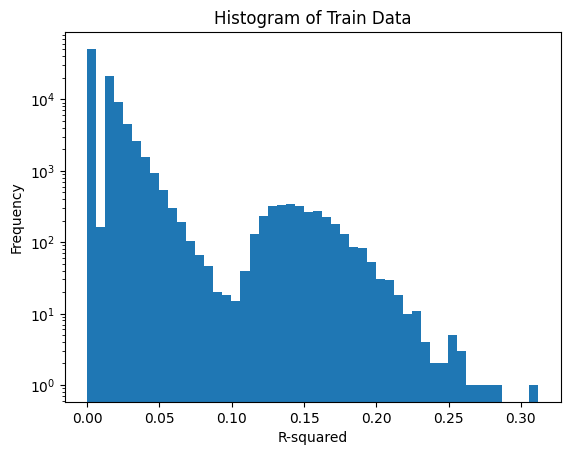

In [14]:
plt.hist(scores_train.cpu().numpy(), bins=50, log=True)
plt.title("Histogram of Train Data")
plt.ylabel("Frequency")
plt.xlabel("R-squared")

Text(0.5, 0, 'R-squared')

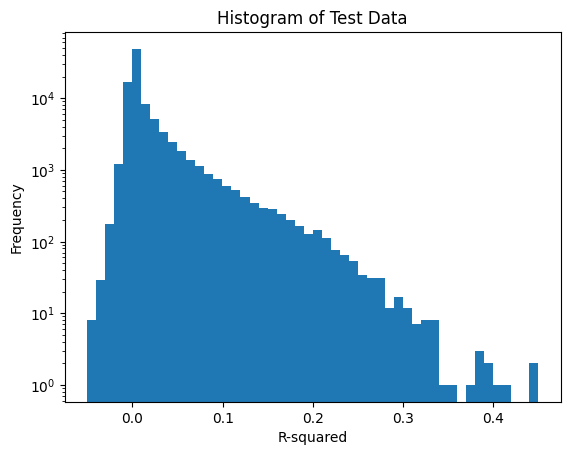

In [15]:
plt.hist(scores_test.cpu().numpy(), bins=50, log=True)
plt.title("Histogram of Test Data")
plt.ylabel("Frequency")
plt.xlabel("R-squared")

# Save trained data 

In [ ]:
subject = "sub-UTS03"
# save the scores
np.save(os.path.join(REPO_DIR, dir,subject,'scores_train'), scores_train.cpu().numpy())
np.save(os.path.join(REPO_DIR, dir,subject,'scores_test'), scores_test.cpu().numpy())

# save the predictions
np.save(os.path.join(REPO_DIR, dir,subject,'train_predict'), train_predict.cpu().numpy())
np.save(os.path.join(REPO_DIR, dir,subject,'test_predict'), test_predict.cpu().numpy())

# plotting on pycortex

In [16]:
def set_pycortex_store(filestore):
    """Set the pycortex store to the specified directory."""
    cortex.database.default_filestore = filestore
    cortex.db.filestore = filestore
    cortex.db.reload_subjects()
    print(f"pycortex store set to {filestore}")


In [17]:
set_pycortex_store(os.path.join(DATA_DIR, 'ds003020/derivative/pycortex-db'))

pycortex store set to /home/ckj24/genevieve/ds003020/derivative/pycortex-db


# Training data score 

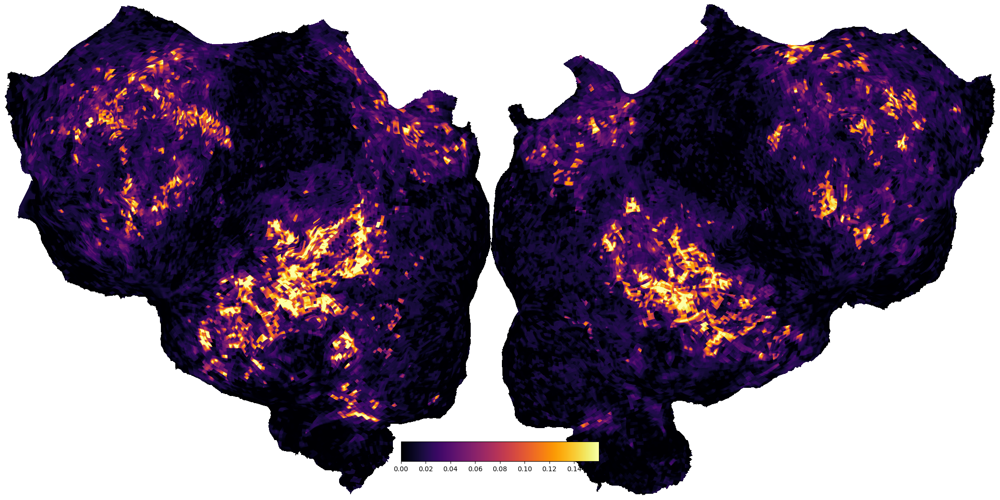

In [18]:
subject = 'UTS03'
xfm = 'UTS03_auto'

# First create example voxel data for this subject and transform
voxel_data = scores_train.cpu().numpy()
voxel_vol = cortex.Volume(voxel_data, subject, xfm,cmap="inferno")

# Then we have to get a mapper from voxels to vertices for this transform
mapper = cortex.get_mapper(subject, xfm, 'line_nearest', recache=True)

# Just pass the voxel data through the mapper to get vertex data
vertex_map = mapper(voxel_vol)

# You can plot both as you would normally plot Volume and Vertex data
cortex.quickshow(voxel_vol, with_rois=False)
plt.show()

# Test data score

Caching mapper...


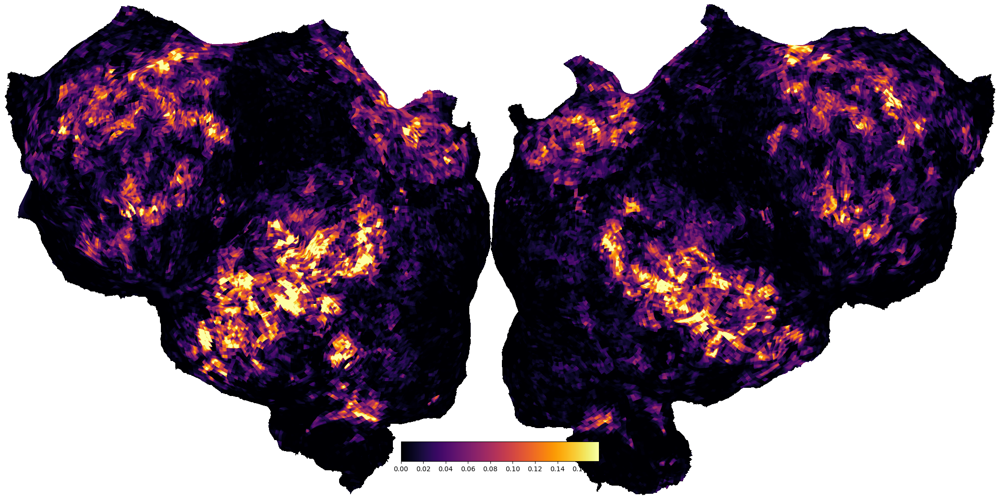

In [19]:
# First create example voxel data for this subject and transform
voxel_data = scores_test.cpu().numpy()
voxel_vol = cortex.Volume(voxel_data, subject, xfm,vmin=0,cmap="inferno")

# Then we have to get a mapper from voxels to vertices for this transform
mapper = cortex.get_mapper(subject, xfm,  recache=True)

# Just pass the voxel data through the mapper to get vertex data
vertex_map = mapper(voxel_vol)

# You can plot both as you would normally plot Volume and Vertex data
cortex.quickshow(voxel_vol, with_rois=False)
plt.show()

<Axes: xlabel='log10(alpha)', ylabel='Number of targets'>

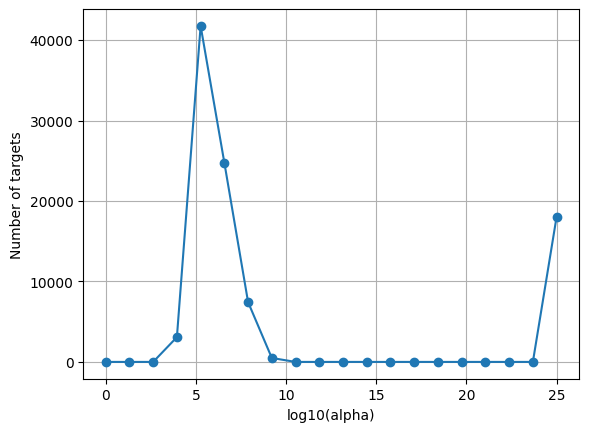

In [20]:
from himalaya.viz import plot_alphas_diagnostic
best_alphas = backend.to_numpy(pipeline[-1].best_alphas_)
plot_alphas_diagnostic(best_alphas=best_alphas, alphas=alphas)

# Test RGB plot

In [21]:
primal_coef = pipeline[-1].get_primal_coef()
primal_coef = backend.to_numpy(primal_coef)
print("(n_delays * n_features, n_voxels) =", primal_coef.shape)

(n_delays * n_features, n_voxels) = (3940, 95556)


In [22]:
primal_coef /= np.linalg.norm(primal_coef, axis=0)[None]
primal_coef *= np.sqrt(np.maximum(0, scores_test.cpu().numpy()))[None]

In [23]:
# split the ridge coefficients per delays
delayer = pipeline.named_steps['delayer']
primal_coef_per_delay = delayer.reshape_by_delays(primal_coef, axis=0)
print("(n_delays, n_features, n_voxels) =", primal_coef_per_delay.shape)
del primal_coef

# average over delays
average_coef = np.mean(primal_coef_per_delay, axis=0)
print("(n_features, n_voxels) =", average_coef.shape)
del primal_coef_per_delay

(n_delays, n_features, n_voxels) = (4, 985, 95556)
(n_features, n_voxels) = (985, 95556)


In [24]:
from sklearn.decomposition import PCA

pca = PCA(n_components=4)
pca.fit(average_coef.T)
components = pca.components_
print("(n_components, n_features) =", components.shape)

(n_components, n_features) = (4, 985)


In [25]:
print("PCA explained variance =", pca.explained_variance_ratio_)

PCA explained variance = [0.12369712 0.09650552 0.08745222 0.06747238]


In [26]:
# Load semantic model
# The SemanticModel class is something I wrote to make it easy to deal with vector-space semantic models.
from utils.SemanticModel import SemanticModel
from config.dir import EM_DATA_DIR 
eng1000 = SemanticModel.load(os.path.join(EM_DATA_DIR, "english1000sm.hf5"))

In [27]:
def print_voxel_words_pca(voxnum):
    # find_words_like_vec returns 10 words most correlated with the given vector, and the correlations
    voxwords = eng1000.find_words_like_vec(components[voxnum,:])
    print ("Best words for voxel %d :" % (voxnum))
    print(voxwords)

In [28]:
print_voxel_words_pca(0)
print_voxel_words_pca(1)
print_voxel_words_pca(2)
print_voxel_words_pca(3)


Best words for voxel 0 :
[(np.float64(0.4464446208307862), b'dome'), (np.float64(0.44441994504601917), b'meters'), (np.float64(0.4368530707240887), b'interior'), (np.float64(0.4337827249243593), b'steel'), (np.float64(0.43093350892236665), b'wide'), (np.float64(0.43009401431271954), b'mounted'), (np.float64(0.4299682666293052), b'floors'), (np.float64(0.429201451291753), b'walls'), (np.float64(0.4286139541049777), b'large'), (np.float64(0.4276095939756016), b'outer')]
Best words for voxel 1 :
[(np.float64(0.3352718187126747), b'qualities'), (np.float64(0.31648926051923865), b'virtue'), (np.float64(0.3024749135826083), b'distinction'), (np.float64(0.30233503360906405), b'considered'), (np.float64(0.3022197546870379), b'perceived'), (np.float64(0.3011802791173437), b'despised'), (np.float64(0.2968665540015298), b'personality'), (np.float64(0.2953642693239052), b'lacking'), (np.float64(0.2950364747111247), b'intellect'), (np.float64(0.29199826248685384), b'universally')]
Best words for vo

In [29]:
# transform with the fitted PCA
average_coef_transformed = pca.transform(average_coef.T).T
print("(n_components, n_voxels) =", average_coef_transformed.shape)
#del average_coef

# We make sure vmin = -vmax, so that the colormap is centered on 0.
vmax = np.percentile(np.abs(average_coef_transformed), 99.9)

(n_components, n_voxels) = (4, 95556)


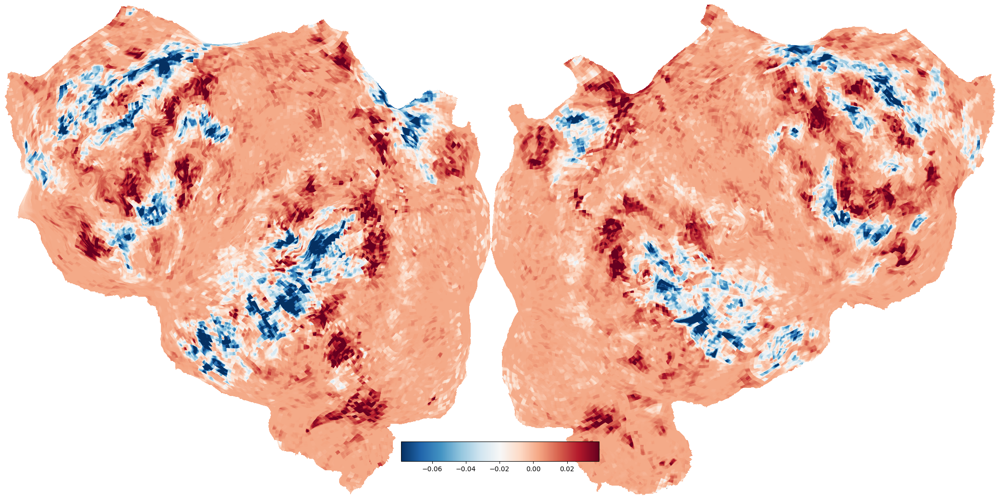

In [35]:
subject = 'UTS03'
# Then we have to get a mapper from voxels to vertices for this transform
mapper = cortex.get_mapper(subject, xfm, 'line_nearest', recache=True)
voxel_data = scores_test.cpu().numpy()
voxel_vol = cortex.Volume(average_coef_transformed[0], subject, xfm)
# Just pass the voxel data through the mapper to get vertex data

# You can plot both as you would normally plot Volume and Vertex data
cortex.quickshow(voxel_vol, with_rois=False, cmap='coolwarm')
plt.show()

In [ ]:
from voxelwise_tutorials.wordnet import scale_to_rgb_cube
voxel_colors = scale_to_rgb_cube(average_coef_transformed[1:4].T, clip=3).T
print("(n_channels, n_voxels) =", voxel_colors.shape)

(n_channels, n_voxels) = (3, 95556)


In [32]:
# Creating three cortex.Volume objects with the test data as np.uint8
subject = 'UTS03'
# Scaling the three datasets to be between 0-255
test1_scaled = voxel_colors[0] / np.max(voxel_colors[0]) * 255
test2_scaled = voxel_colors[1] / np.max(voxel_colors[1]) * 255
test3_scaled = voxel_colors[2] / np.max(voxel_colors[2]) * 255
red = cortex.Volume(test1_scaled.astype(np.uint8), subject, xfm)
green = cortex.Volume(test2_scaled.astype(np.uint8),  subject, xfm)
blue = cortex.Volume(test3_scaled.astype(np.uint8),  subject, xfm)

Background RRGGBBAA: ffffff00
Area 0:0:2062.8:1024 exported to 2063 x 1024 pixels (96 dpi)


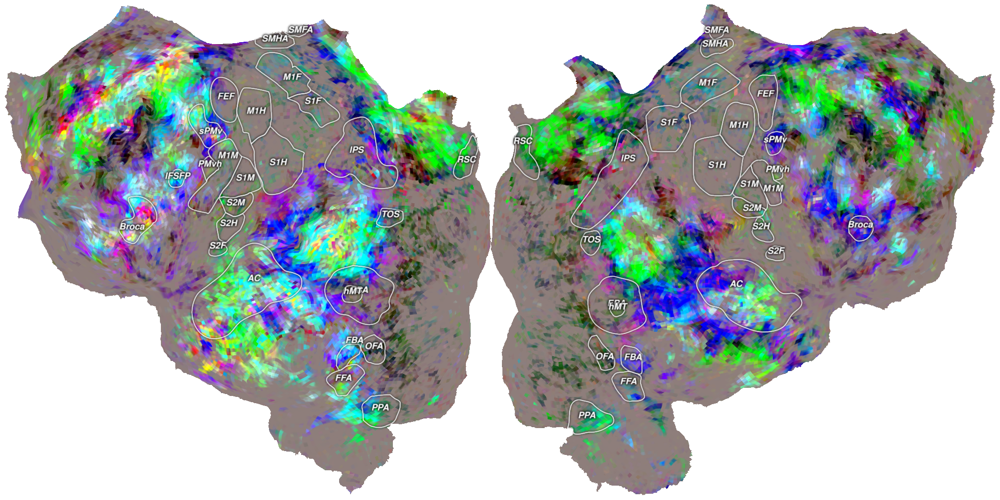

In [36]:
vol_data = cortex.VolumeRGB(red, green, blue, subject,vmin=0, vmax=1, vmin2=0, vmax2=1, vmin3=0, vmax3=1)
cortex.quickshow(vol_data, with_colorbar=False)
plt.show()

# Train RGB

In [ ]:
primal_coef = pipeline[-1].get_primal_coef()
primal_coef = backend.to_numpy(primal_coef)
print("(n_delays * n_features, n_voxels) =", primal_coef.shape)

(n_delays * n_features, n_voxels) = (3940, 95556)


In [38]:
primal_coef /= np.linalg.norm(primal_coef, axis=0)[None]
primal_coef *= np.sqrt(np.maximum(0, scores_train.cpu().numpy()))[None]

In [39]:
# split the ridge coefficients per delays
delayer = pipeline.named_steps['delayer']
primal_coef_per_delay = delayer.reshape_by_delays(primal_coef, axis=0)
print("(n_delays, n_features, n_voxels) =", primal_coef_per_delay.shape)
del primal_coef

# average over delays
average_coef = np.mean(primal_coef_per_delay, axis=0)
print("(n_features, n_voxels) =", average_coef.shape)
del primal_coef_per_delay

(n_delays, n_features, n_voxels) = (4, 985, 95556)
(n_features, n_voxels) = (985, 95556)


In [40]:
pca = PCA(n_components=4)
pca.fit(average_coef.T)
components = pca.components_
print("(n_components, n_features) =", components.shape)

(n_components, n_features) = (4, 985)


In [41]:
print("PCA explained variance =", pca.explained_variance_ratio_)

PCA explained variance = [0.10316253 0.08944323 0.08065946 0.06390365]


In [42]:
def print_voxel_words_pca(voxnum):
    # find_words_like_vec returns 10 words most correlated with the given vector, and the correlations
    voxwords = eng1000.find_words_like_vec(components[voxnum,:])
    print ("Best words for voxel %d :" % (voxnum))
    print(voxwords)

In [43]:
# transform with the fitted PCA
average_coef_transformed = pca.transform(average_coef.T).T
print("(n_components, n_voxels) =", average_coef_transformed.shape)
#del average_coef

# We make sure vmin = -vmax, so that the colormap is centered on 0.
vmax = np.percentile(np.abs(average_coef_transformed), 99.9)

(n_components, n_voxels) = (4, 95556)


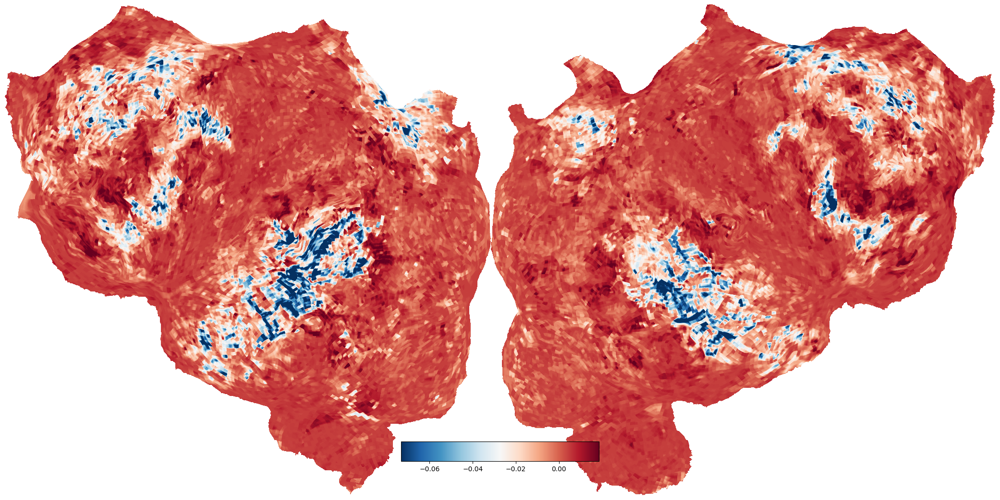

In [ ]:
subject = 'UTS03'
# Then we have to get a mapper from voxels to vertices for this transform
mapper = cortex.get_mapper(subject, xfm, 'line_nearest', recache=True)
voxel_data = scores_train.cpu().numpy()
voxel_vol = cortex.Volume(average_coef_transformed[0], subject, xfm)
# Just pass the voxel data through the mapper to get vertex data

# You can plot both as you would normally plot Volume and Vertex data
cortex.quickshow(voxel_vol, with_rois=False, cmap='coolwarm')
plt.show()

In [ ]:
voxel_colors = scale_to_rgb_cube(average_coef_transformed[1:4].T, clip=3).T
print("(n_channels, n_voxels) =", voxel_colors.shape)

(n_channels, n_voxels) = (3, 95556)


In [49]:
# Creating three cortex.Volume objects with the test data as np.uint8
subject = 'UTS03'
# Scaling the three datasets to be between 0-255
test1_scaled = voxel_colors[0] / np.max(voxel_colors[0]) * 255
test2_scaled = voxel_colors[1] / np.max(voxel_colors[1]) * 255
test3_scaled = voxel_colors[2] / np.max(voxel_colors[2]) * 255
red = cortex.Volume(test1_scaled.astype(np.uint8), subject, xfm)
green = cortex.Volume(test2_scaled.astype(np.uint8),  subject, xfm)
blue = cortex.Volume(test3_scaled.astype(np.uint8),  subject, xfm)

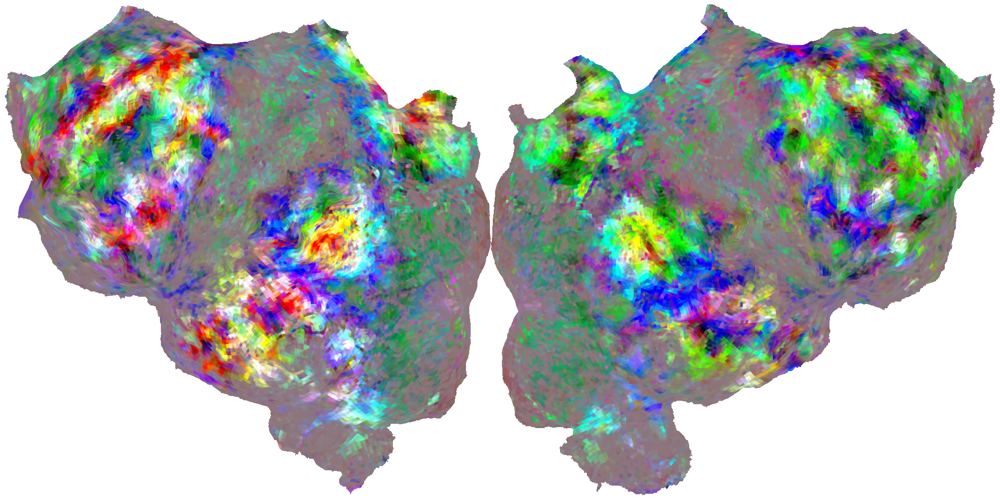

In [53]:
vol_data = cortex.VolumeRGB(red, green, blue, subject,vmin=0, vmax=1, vmin2=0, vmax2=1, vmin3=0, vmax3=1)
cortex.quickshow(vol_data, with_colorbar=False, with_rois=False)
plt.show()

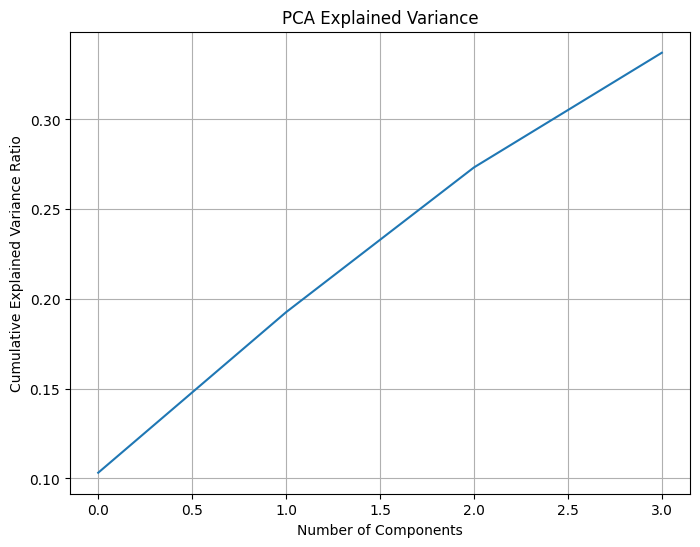

In [51]:
import matplotlib.pyplot as plt

# Plotting the explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('PCA Explained Variance')
plt.grid(True)
plt.show()